In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

In [2]:
# Будем анализировать данные только на обучающей выборке
data = pd.read_csv('test.csv', sep=",")

In [3]:
# Первые 5 строк датасета
data.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [4]:
# Размер датасета - 1000 строк, 21 колонок
data.shape

(1000, 21)

In [5]:
total_count = data.shape[0]
print('Всего строк: {}'.format(total_count))

Всего строк: 1000


In [6]:
# Список колонок
data.columns

Index(['id', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc',
       'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc',
       'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi'],
      dtype='object')

In [7]:
# Список колонок с типами данных
data.dtypes

id                 int64
battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
dtype: object

In [8]:
# Проверим наличие пустых значений
# Цикл по колонкам датасета
for col in data.columns:
    # Количество пустых значений - все значения заполнены
    temp_null_count = data[data[col].isnull()].shape[0]
    print('{} - {}'.format(col, temp_null_count))

id - 0
battery_power - 0
blue - 0
clock_speed - 0
dual_sim - 0
fc - 0
four_g - 0
int_memory - 0
m_dep - 0
mobile_wt - 0
n_cores - 0
pc - 0
px_height - 0
px_width - 0
ram - 0
sc_h - 0
sc_w - 0
talk_time - 0
three_g - 0
touch_screen - 0
wifi - 0


In [9]:
# Основные статистические характеристки набора данных
data.describe()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000
mean,500.500000,1248.510000,0.516000,1.540900,0.517000,4.593000,0.487000,33.652000,0.517500,139.51100,...,10.054000,627.121000,1239.774000,2138.998000,11.995000,5.316000,11.085000,0.756000,0.50000,0.507000
std,288.819436,432.458227,0.499994,0.829268,0.499961,4.463325,0.500081,18.128694,0.280861,34.85155,...,6.095099,432.929699,439.670981,1088.092278,4.320607,4.240062,5.497636,0.429708,0.50025,0.500201
min,1.000000,500.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.00000,...,0.000000,0.000000,501.000000,263.000000,5.000000,0.000000,2.000000,0.000000,0.00000,0.000000
25%,250.750000,895.000000,0.000000,0.700000,0.000000,1.000000,0.000000,18.000000,0.300000,109.75000,...,5.000000,263.750000,831.750000,1237.250000,8.000000,2.000000,6.750000,1.000000,0.00000,0.000000
50%,500.500000,1246.500000,1.000000,1.500000,1.000000,3.000000,0.000000,34.500000,0.500000,139.00000,...,10.000000,564.500000,1250.000000,2153.500000,12.000000,5.000000,11.000000,1.000000,0.50000,1.000000
75%,750.250000,1629.250000,1.000000,2.300000,1.000000,7.000000,1.000000,49.000000,0.800000,170.00000,...,16.000000,903.000000,1637.750000,3065.500000,16.000000,8.000000,16.000000,1.000000,1.00000,1.000000
max,1000.000000,1999.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.00000,...,20.000000,1907.000000,1998.000000,3989.000000,19.000000,18.000000,20.000000,1.000000,1.00000,1.000000


In [10]:
# Определим уникальные значения для целевого признака
data['battery_power'].unique()

array([1043,  841, 1807, 1546, 1434, 1464, 1718,  833, 1111, 1520, 1500,
       1343,  900, 1190,  630, 1846, 1985, 1042, 1231, 1488,  968,  529,
       1558,  533, 1037, 1025, 1858,  980,  644, 1024, 1981, 1380, 1557,
       1201, 1074, 1175, 1280, 1715, 1165,  567, 1952,  822,  685, 1388,
       1972, 1411, 1094, 1653,  916, 1712,  882,  632, 1442, 1630, 1596,
       1272, 1640, 1889, 1907,  578, 1634, 1533,  660, 1847, 1206,  549,
       1705, 1366, 1991, 1102, 1452, 1810, 1166,  881, 1134, 1031, 1376,
       1391,  979, 1075, 1999, 1626,  942, 1182, 1982, 1373, 1151, 1650,
       1663, 1965,  679, 1465, 1809,  757, 1034, 1119,  559, 1204, 1008,
       1397,  697, 1939, 1039, 1605,  769,  861,  504, 1930, 1795, 1363,
       1901, 1319,  859, 1664,  955,  517, 1806, 1348, 1455, 1611, 1573,
        557, 1599, 1051, 1857, 1986,  591, 1140,  923, 1582,  723, 1251,
        574,  948, 1571,  564, 1466,  597,  895, 1535, 1832, 1045, 1483,
        976, 1840,  624, 1963, 1307, 1933, 1496, 15

<Axes: xlabel='battery_power', ylabel='talk_time'>

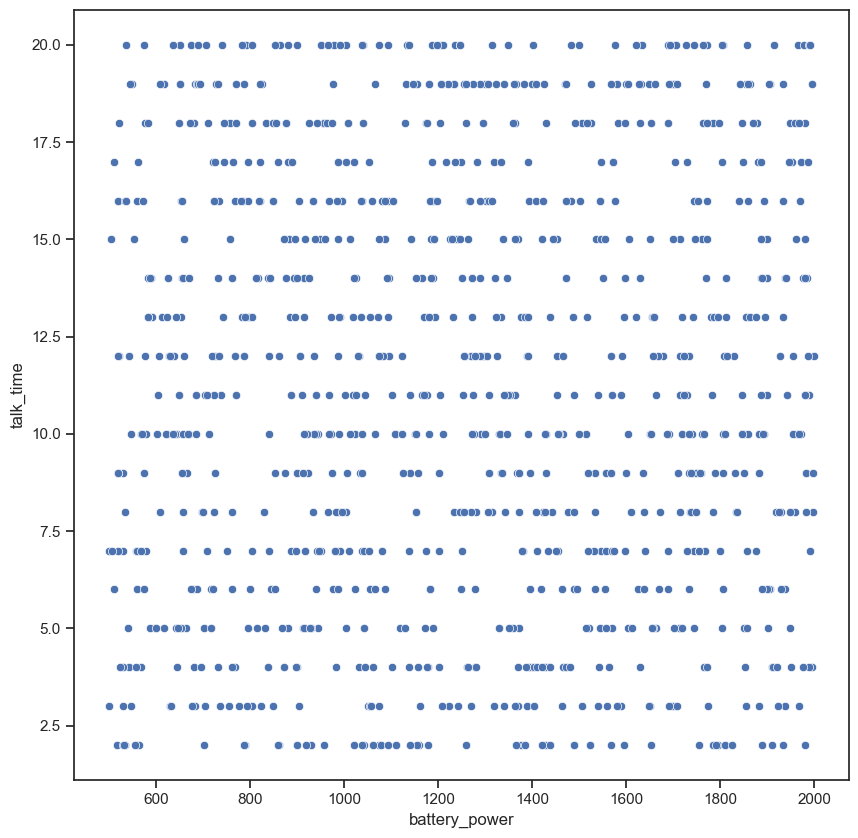

In [11]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.scatterplot(ax=ax, x='battery_power', y='talk_time', data=data)

<Axes: xlabel='battery_power', ylabel='talk_time'>

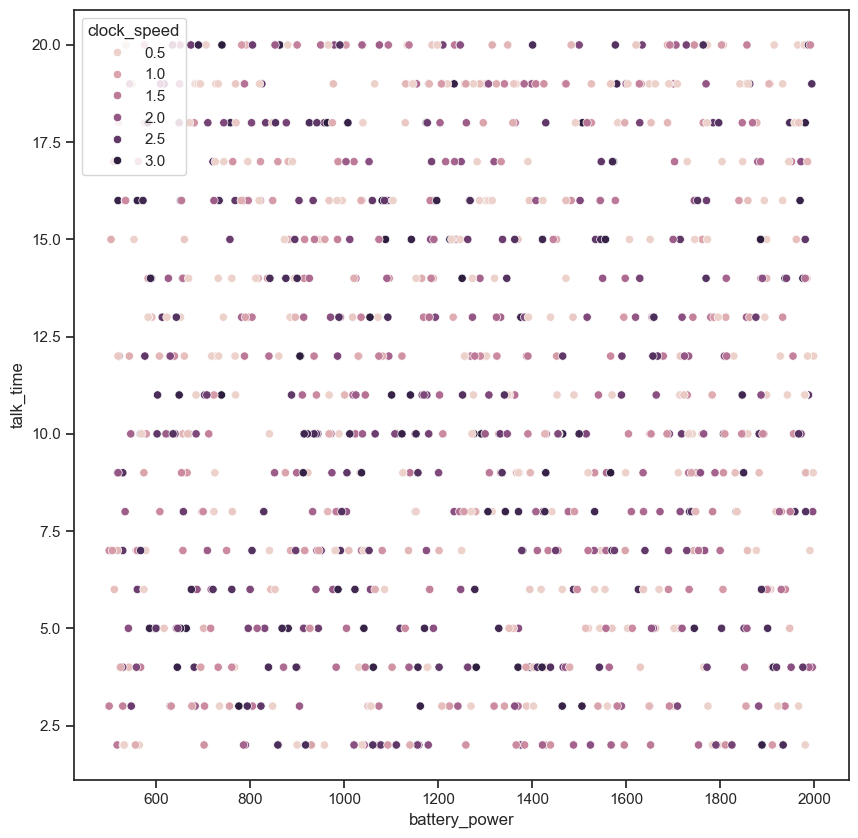

In [12]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.scatterplot(ax=ax, x='battery_power', y='talk_time', data=data, hue='clock_speed')

C:\Users\Yan note\AppData\Local\Temp\ipykernel_5944\4208595754.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['clock_speed'])


<Axes: xlabel='clock_speed', ylabel='Density'>

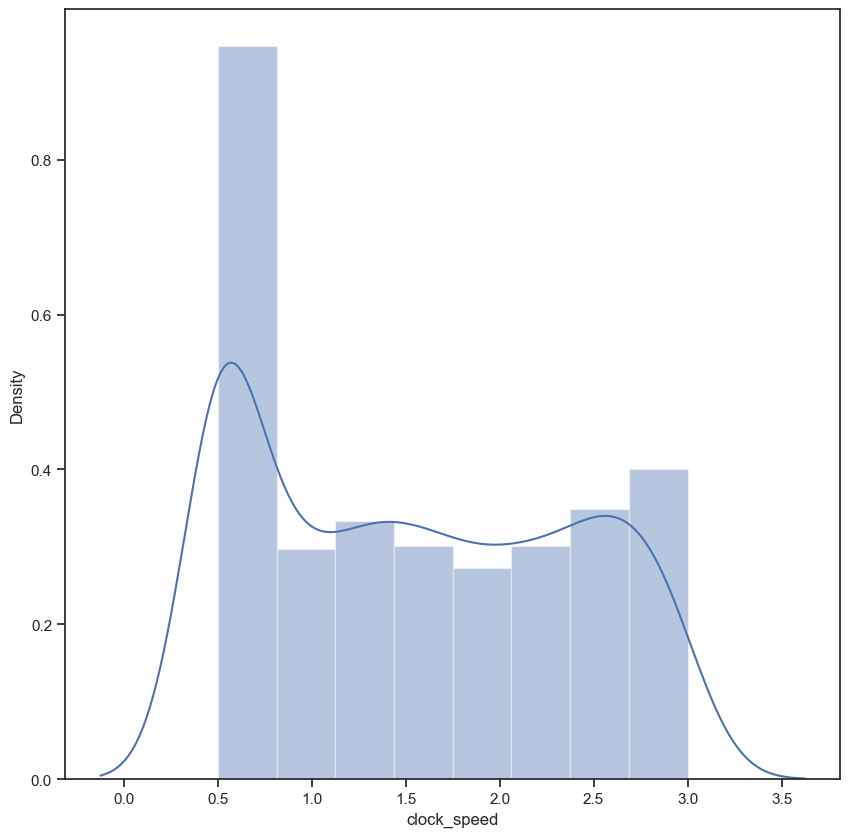

In [13]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.distplot(data['clock_speed'])

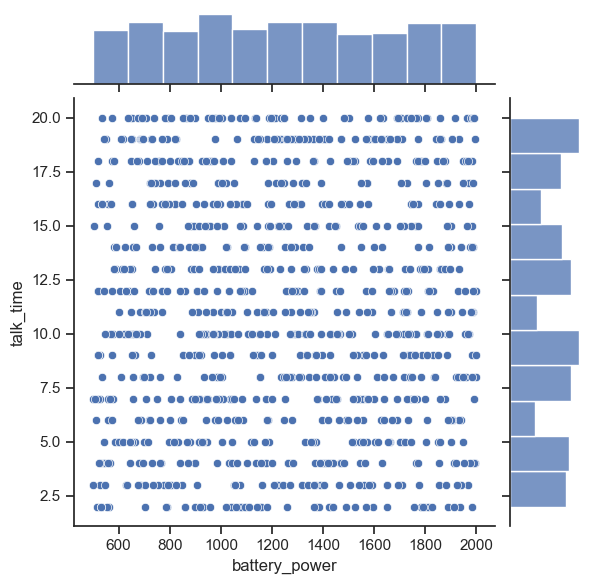

In [14]:
sns.jointplot(x='battery_power', y='talk_time', data=data)

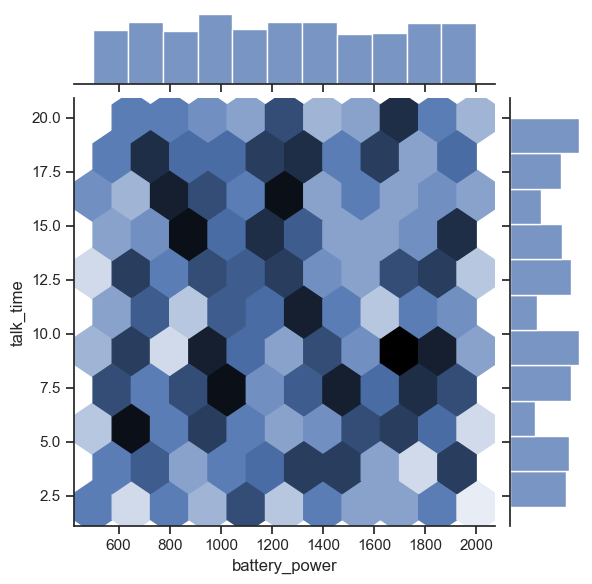

In [15]:

sns.jointplot(x='battery_power', y='talk_time', data=data, kind="hex")

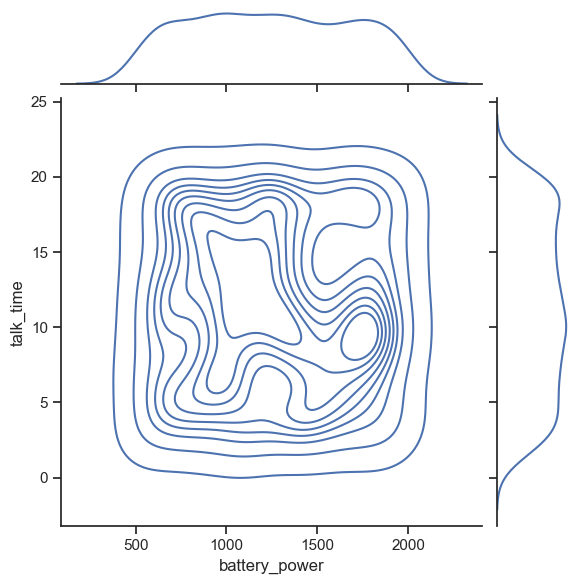

In [16]:

sns.jointplot(x='battery_power', y='talk_time', data=data, kind="kde")

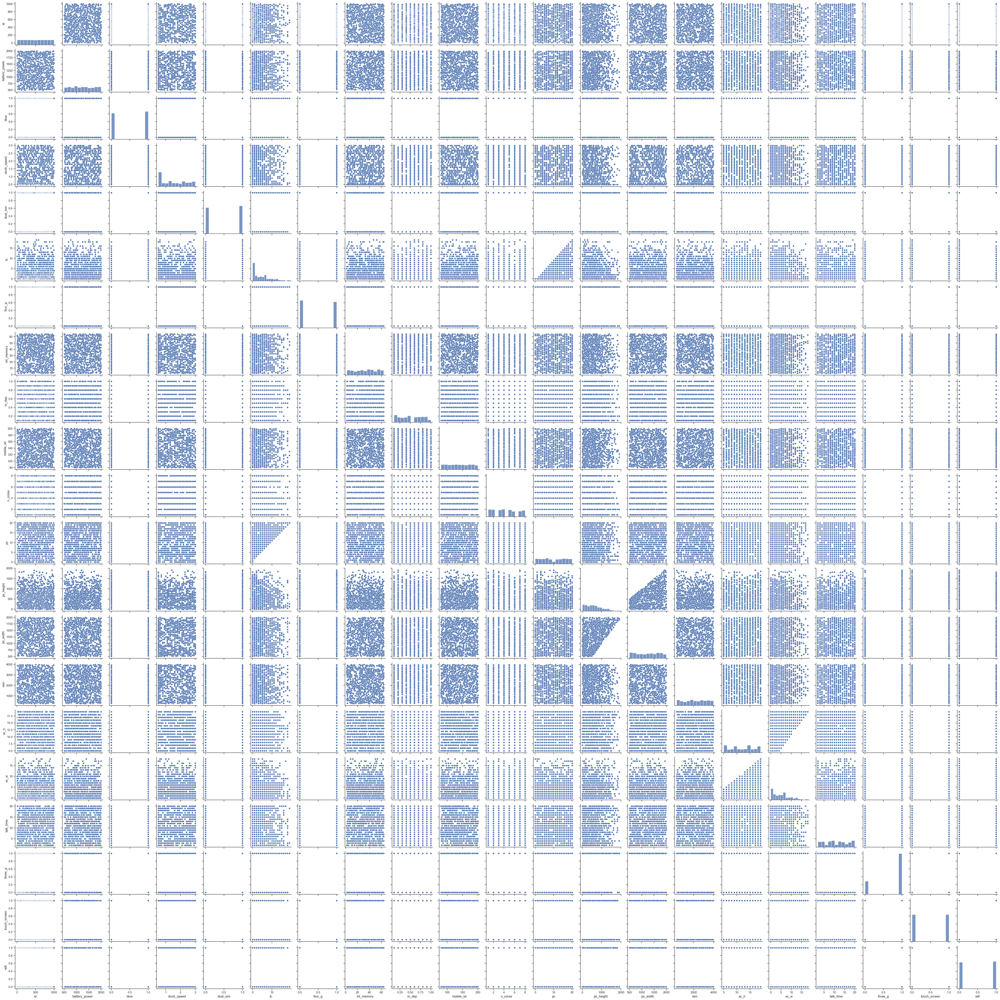

In [17]:
sns.pairplot(data)

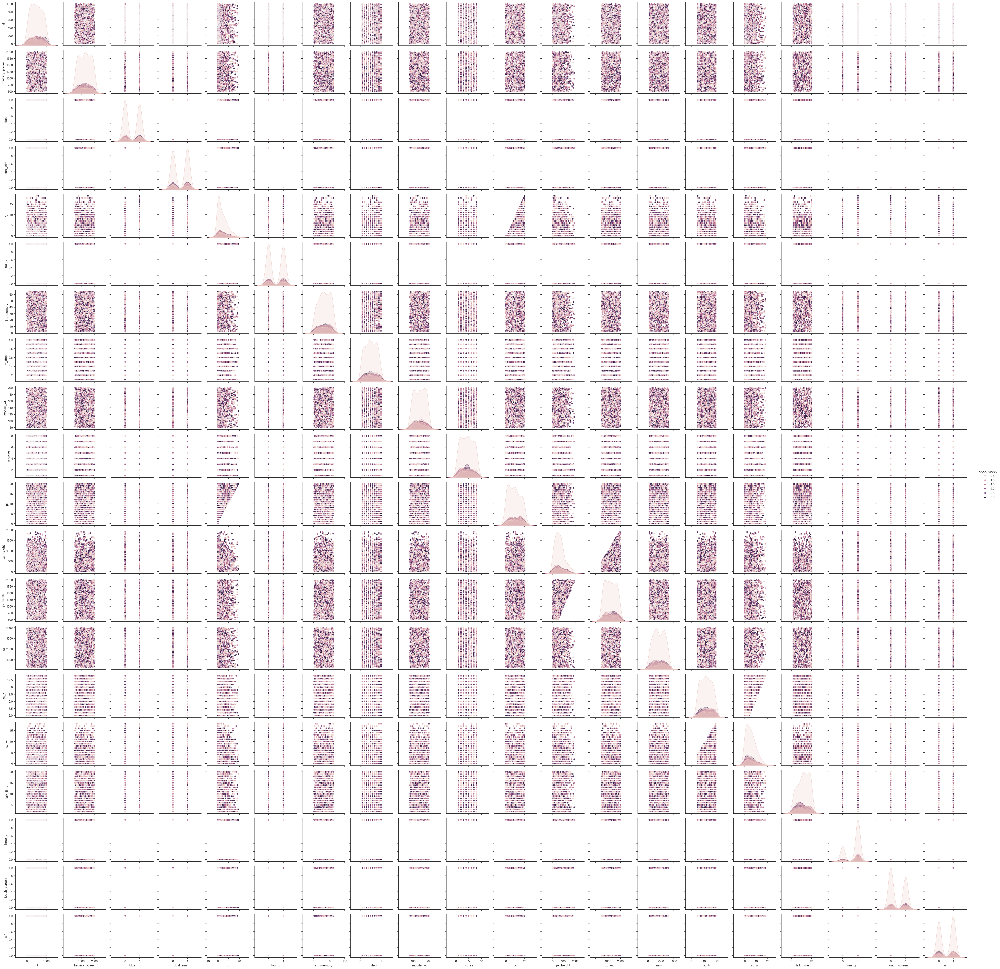

In [18]:
sns.pairplot(data, hue="clock_speed")

<Axes: xlabel='clock_speed'>

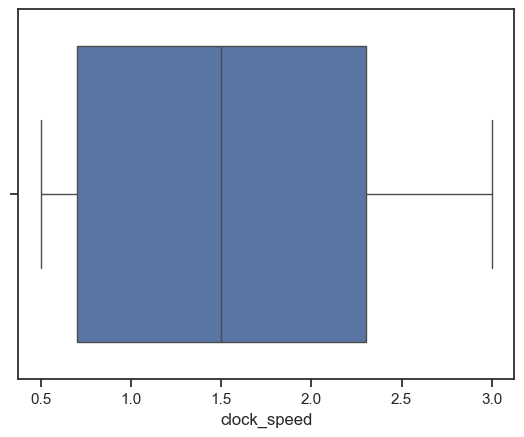

In [19]:

sns.boxplot(x=data['clock_speed'])

<Axes: ylabel='clock_speed'>

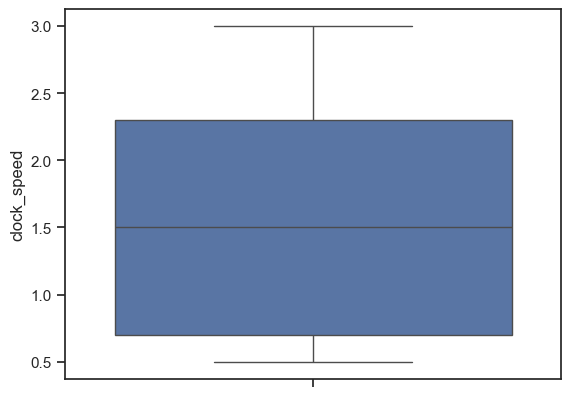

In [20]:
# По вертикали
sns.boxplot(y=data['clock_speed'])

<Axes: xlabel='n_cores', ylabel='clock_speed'>

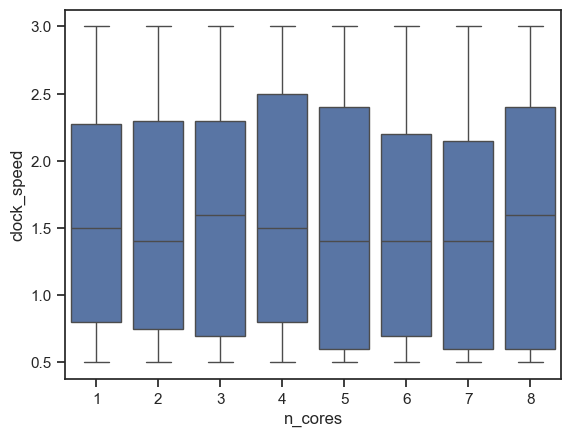

In [21]:
# Распределение параметра clock_speed сгруппированные по n_cores.
sns.boxplot(x='n_cores', y='clock_speed', data=data)

<Axes: xlabel='battery_power'>

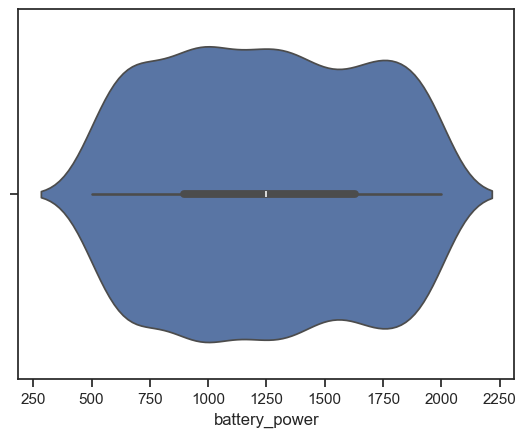

In [22]:
sns.violinplot(x=data['battery_power'])

C:\Users\Yan note\AppData\Local\Temp\ipykernel_5944\3938310945.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['talk_time'], ax=ax[1])


<Axes: xlabel='talk_time', ylabel='Density'>

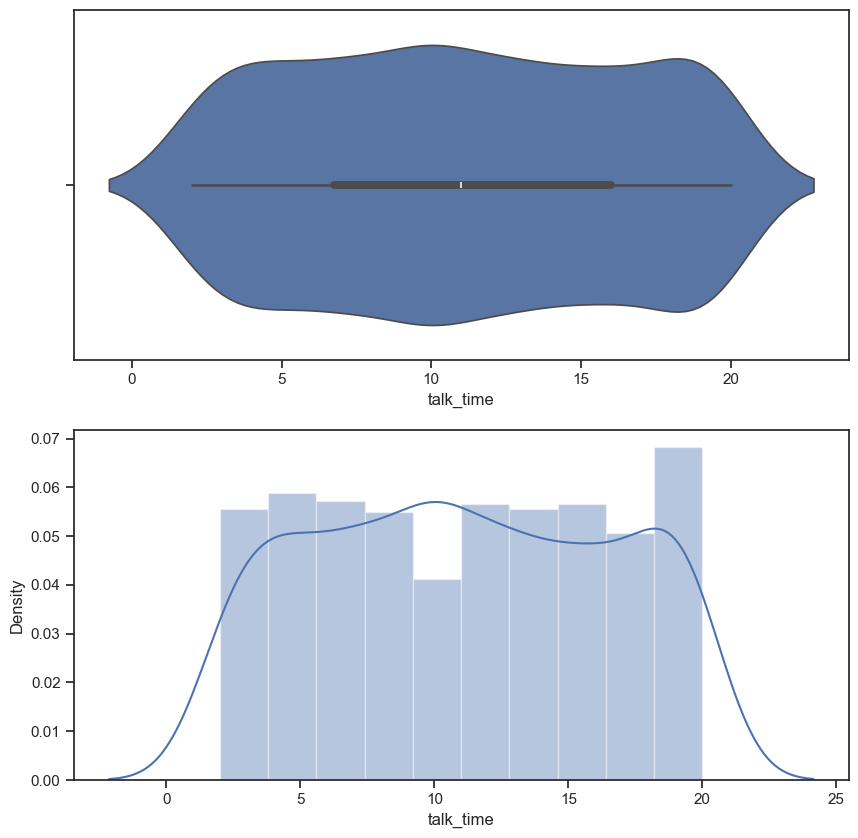

In [23]:
fig, ax = plt.subplots(2, 1, figsize=(10,10))
sns.violinplot(ax=ax[0], x=data['talk_time'])
sns.distplot(data['talk_time'], ax=ax[1])

<Axes: xlabel='four_g', ylabel='battery_power'>

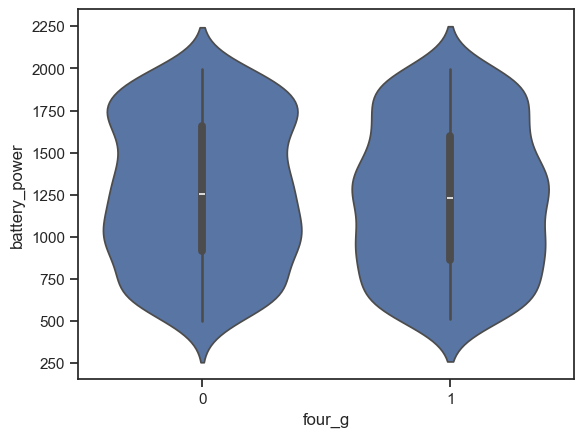

In [24]:
# Распределение параметра Humidity сгруппированные по Occupancy.
sns.violinplot(x='four_g', y='battery_power', data=data)

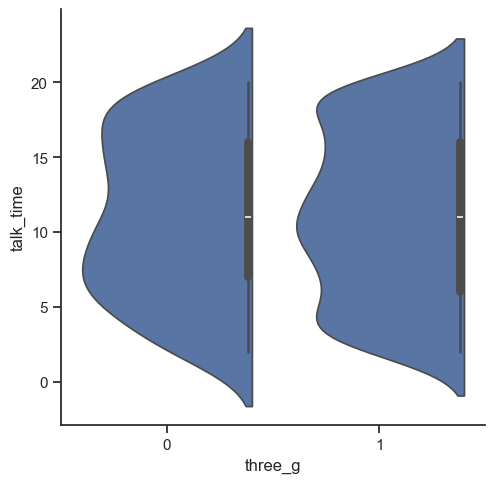

In [25]:
sns.catplot(y='talk_time', x='three_g', data=data, kind="violin", split=True)

In [26]:
data.corr()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
id,1.000000,-0.021511,0.000464,0.035917,-0.002721,0.016934,0.030921,-0.014023,-0.002794,-0.007541,...,0.001969,-0.025056,-0.012138,-0.043442,-0.011972,0.002918,0.030807,4.957099e-02,3.976791e-02,-0.036643
battery_power,-0.021511,1.000000,-0.046610,-0.039075,-0.061171,-0.007846,-0.042520,0.003751,-0.009065,-0.047065,...,0.012847,0.048647,0.053365,-0.032366,-0.055665,-0.023905,0.015546,3.151417e-02,-1.013784e-02,-0.000414
blue,0.000464,-0.046610,1.000000,0.034754,-0.011100,-0.056063,-0.001169,-0.012416,0.018319,0.023513,...,-0.025247,-0.058810,-0.032054,0.057570,0.012780,0.004223,-0.031995,1.352986e-02,-6.003074e-02,0.025568
clock_speed,0.035917,-0.039075,0.034754,1.000000,-0.012423,0.010127,-0.024665,-0.030487,0.016995,-0.014107,...,0.047469,0.017277,0.070585,-0.000650,-0.039503,-0.027138,-0.078797,-2.140644e-02,6.189276e-02,-0.048593
dual_sim,-0.002721,-0.061171,-0.011100,-0.012423,1.000000,0.057606,0.024907,-0.012158,0.021760,-0.001734,...,0.073936,0.006842,0.015610,0.048171,0.006295,-0.002064,0.004390,6.895838e-04,3.401967e-02,0.031545
fc,0.016934,-0.007846,-0.056063,0.010127,0.057606,1.000000,0.032832,-0.006565,0.020859,0.018353,...,0.659338,-0.017982,0.030550,-0.051997,0.045158,0.006115,-0.051458,-1.112104e-02,1.546706e-02,-0.060373
four_g,0.030921,-0.042520,-0.001169,-0.024665,0.024907,0.032832,1.000000,-0.037488,0.014806,-0.000509,...,0.037669,0.033655,0.036545,0.030821,-0.015087,-0.000893,0.013692,5.535283e-01,-1.000338e-02,-0.035652
int_memory,-0.014023,0.003751,-0.012416,-0.030487,-0.012158,-0.006565,-0.037488,1.000000,-0.004386,-0.010447,...,0.022682,-0.009564,-0.003877,-0.007107,-0.009249,0.024521,0.023759,-1.592239e-02,2.218589e-02,0.011860
m_dep,-0.002794,-0.009065,0.018319,0.016995,0.021760,0.020859,0.014806,-0.004386,1.000000,-0.041994,...,0.012663,0.062559,0.034861,0.018349,-0.026160,-0.023393,0.024124,-2.927827e-02,4.025363e-02,-0.039705
mobile_wt,-0.007541,-0.047065,0.023513,-0.014107,-0.001734,0.018353,-0.000509,-0.010447,-0.041994,1.000000,...,0.027343,0.011157,-0.014577,0.028786,-0.022053,0.022148,-0.021704,6.261881e-03,4.452531e-02,0.069762


In [27]:
data.corr(method='pearson')

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
id,1.000000,-0.021511,0.000464,0.035917,-0.002721,0.016934,0.030921,-0.014023,-0.002794,-0.007541,...,0.001969,-0.025056,-0.012138,-0.043442,-0.011972,0.002918,0.030807,4.957099e-02,3.976791e-02,-0.036643
battery_power,-0.021511,1.000000,-0.046610,-0.039075,-0.061171,-0.007846,-0.042520,0.003751,-0.009065,-0.047065,...,0.012847,0.048647,0.053365,-0.032366,-0.055665,-0.023905,0.015546,3.151417e-02,-1.013784e-02,-0.000414
blue,0.000464,-0.046610,1.000000,0.034754,-0.011100,-0.056063,-0.001169,-0.012416,0.018319,0.023513,...,-0.025247,-0.058810,-0.032054,0.057570,0.012780,0.004223,-0.031995,1.352986e-02,-6.003074e-02,0.025568
clock_speed,0.035917,-0.039075,0.034754,1.000000,-0.012423,0.010127,-0.024665,-0.030487,0.016995,-0.014107,...,0.047469,0.017277,0.070585,-0.000650,-0.039503,-0.027138,-0.078797,-2.140644e-02,6.189276e-02,-0.048593
dual_sim,-0.002721,-0.061171,-0.011100,-0.012423,1.000000,0.057606,0.024907,-0.012158,0.021760,-0.001734,...,0.073936,0.006842,0.015610,0.048171,0.006295,-0.002064,0.004390,6.895838e-04,3.401967e-02,0.031545
fc,0.016934,-0.007846,-0.056063,0.010127,0.057606,1.000000,0.032832,-0.006565,0.020859,0.018353,...,0.659338,-0.017982,0.030550,-0.051997,0.045158,0.006115,-0.051458,-1.112104e-02,1.546706e-02,-0.060373
four_g,0.030921,-0.042520,-0.001169,-0.024665,0.024907,0.032832,1.000000,-0.037488,0.014806,-0.000509,...,0.037669,0.033655,0.036545,0.030821,-0.015087,-0.000893,0.013692,5.535283e-01,-1.000338e-02,-0.035652
int_memory,-0.014023,0.003751,-0.012416,-0.030487,-0.012158,-0.006565,-0.037488,1.000000,-0.004386,-0.010447,...,0.022682,-0.009564,-0.003877,-0.007107,-0.009249,0.024521,0.023759,-1.592239e-02,2.218589e-02,0.011860
m_dep,-0.002794,-0.009065,0.018319,0.016995,0.021760,0.020859,0.014806,-0.004386,1.000000,-0.041994,...,0.012663,0.062559,0.034861,0.018349,-0.026160,-0.023393,0.024124,-2.927827e-02,4.025363e-02,-0.039705
mobile_wt,-0.007541,-0.047065,0.023513,-0.014107,-0.001734,0.018353,-0.000509,-0.010447,-0.041994,1.000000,...,0.027343,0.011157,-0.014577,0.028786,-0.022053,0.022148,-0.021704,6.261881e-03,4.452531e-02,0.069762


In [28]:
data.corr(method='kendall')

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
id,1.000000,-0.014642,0.000379,0.022913,-0.002223,0.015286,0.025259,-0.008959,-0.002062,-0.005062,...,0.001245,-0.017399,-0.007790,-0.028539,-0.007840,0.004784,0.022192,0.040495,0.032487,-0.029934
battery_power,-0.014642,1.000000,-0.037355,-0.028638,-0.049750,-0.003582,-0.034800,0.002243,-0.008088,-0.031098,...,0.008131,0.039296,0.033978,-0.021184,-0.036942,-0.023354,0.009927,0.025221,-0.008552,-0.001161
blue,0.000379,-0.037355,1.000000,0.030896,-0.011100,-0.048711,-0.001169,-0.009262,0.015996,0.019124,...,-0.020289,-0.050259,-0.025943,0.047686,0.009751,0.014992,-0.027108,0.013530,-0.060031,0.025568
clock_speed,0.022913,-0.028638,0.030896,1.000000,-0.009859,0.013716,-0.018862,-0.022505,0.012130,-0.012124,...,0.037885,0.004449,0.045304,0.000222,-0.021303,-0.012842,-0.057189,-0.013938,0.053901,-0.040399
dual_sim,-0.002223,-0.049750,-0.011100,-0.009859,1.000000,0.045883,0.024907,-0.008761,0.017487,-0.001706,...,0.060287,0.005753,0.012074,0.039924,0.004931,-0.013582,0.004367,0.000690,0.034020,0.031545
fc,0.015286,-0.003582,-0.048711,0.013716,0.045883,1.000000,0.030866,-0.010924,0.000634,0.015602,...,0.546284,-0.001417,0.029260,-0.033854,0.033189,0.009005,-0.035938,-0.009002,0.008588,-0.043004
four_g,0.025259,-0.034800,-0.001169,-0.018862,0.024907,0.030866,1.000000,-0.030211,0.011636,-0.001006,...,0.031323,0.019940,0.029401,0.025328,-0.013382,0.001614,0.011647,0.553528,-0.010003,-0.035652
int_memory,-0.008959,0.002243,-0.009262,-0.022505,-0.008761,-0.010924,-0.030211,1.000000,-0.001610,-0.006933,...,0.015071,-0.001466,-0.004318,-0.005489,-0.006207,0.015771,0.017143,-0.013434,0.018601,0.009572
m_dep,-0.002062,-0.008088,0.015996,0.012130,0.017487,0.000634,0.011636,-0.001610,1.000000,-0.030057,...,0.009311,0.048218,0.027173,0.012503,-0.017984,-0.007319,0.017664,-0.026419,0.033910,-0.035468
mobile_wt,-0.005062,-0.031098,0.019124,-0.012124,-0.001706,0.015602,-0.001006,-0.006933,-0.030057,1.000000,...,0.018852,0.011434,-0.009812,0.019197,-0.016760,0.017805,-0.014857,0.004717,0.036312,0.056605


In [29]:
data.corr(method='spearman')

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
id,1.000000,-0.021645,0.000464,0.033698,-0.002721,0.022188,0.030921,-0.013187,-0.002531,-0.007972,...,0.002013,-0.026025,-0.012132,-0.044083,-0.011866,0.007179,0.031473,0.049571,0.039768,-0.036643
battery_power,-0.021645,1.000000,-0.045712,-0.040932,-0.060879,-0.004957,-0.042585,0.004165,-0.010292,-0.046219,...,0.012198,0.058443,0.050862,-0.031898,-0.054201,-0.033250,0.014609,0.030863,-0.010465,-0.001420
blue,0.000464,-0.045712,1.000000,0.036733,-0.011100,-0.057047,-0.001169,-0.011249,0.018642,0.023316,...,-0.024266,-0.061499,-0.031747,0.058365,0.011561,0.017696,-0.032343,0.013530,-0.060031,0.025568
clock_speed,0.033698,-0.040932,0.036733,1.000000,-0.011722,0.019657,-0.022425,-0.032033,0.016878,-0.017397,...,0.053668,0.006631,0.066784,-0.000620,-0.030142,-0.018160,-0.082377,-0.016571,0.064083,-0.048031
dual_sim,-0.002721,-0.060879,-0.011100,-0.011722,1.000000,0.053735,0.024907,-0.010639,0.020379,-0.002080,...,0.072106,0.007040,0.014776,0.048865,0.005847,-0.016031,0.005210,0.000690,0.034020,0.031545
fc,0.022188,-0.004957,-0.057047,0.019657,0.053735,1.000000,0.036149,-0.016247,0.001482,0.021846,...,0.680815,-0.001856,0.041365,-0.048185,0.045861,0.012284,-0.049499,-0.010543,0.010057,-0.050364
four_g,0.030921,-0.042585,-0.001169,-0.022425,0.024907,0.036149,1.000000,-0.036689,0.013561,-0.001227,...,0.037463,0.024399,0.035980,0.031000,-0.015865,0.001906,0.013896,0.553528,-0.010003,-0.035652
int_memory,-0.013187,0.004165,-0.011249,-0.032033,-0.010639,-0.016247,-0.036689,1.000000,-0.003027,-0.010549,...,0.021581,-0.001635,-0.006883,-0.007517,-0.008829,0.022713,0.024067,-0.016315,0.022589,0.011625
m_dep,-0.002531,-0.010292,0.018642,0.016878,0.020379,0.001482,0.013561,-0.003027,1.000000,-0.042208,...,0.012423,0.069661,0.036466,0.018082,-0.025489,-0.011340,0.024175,-0.030789,0.039519,-0.041335
mobile_wt,-0.007972,-0.046219,0.023316,-0.017397,-0.002080,0.021846,-0.001227,-0.010549,-0.042208,1.000000,...,0.027469,0.016203,-0.014540,0.028370,-0.023558,0.024994,-0.022406,0.005751,0.044273,0.069015


<Axes: >

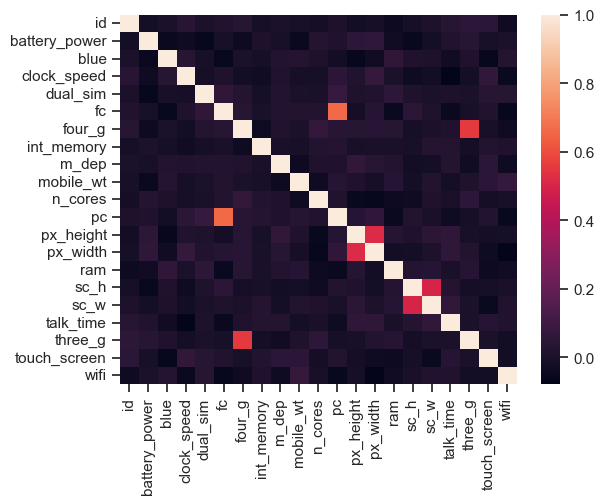

In [30]:
sns.heatmap(data.corr())

<Axes: >

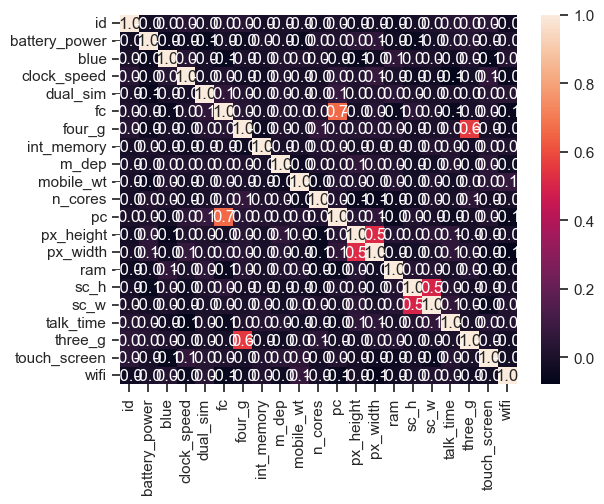

In [31]:
# Вывод значений в ячейках
sns.heatmap(data.corr(), annot=True, fmt='.1f')

<Axes: >

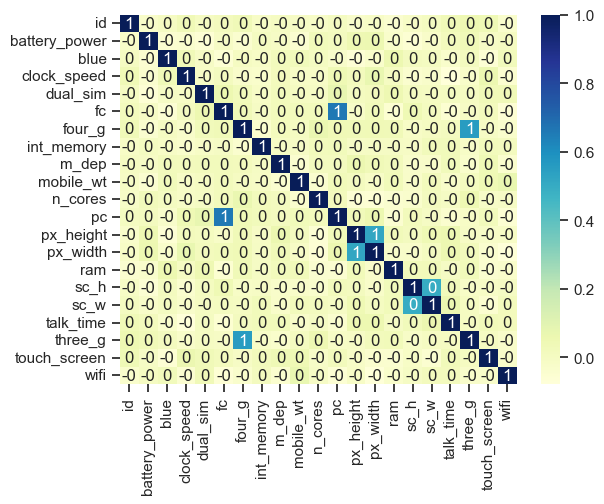

In [32]:
# Изменение цветовой гаммы
sns.heatmap(data.corr(), cmap='YlGnBu', annot=True, fmt='.0f')

<Axes: >

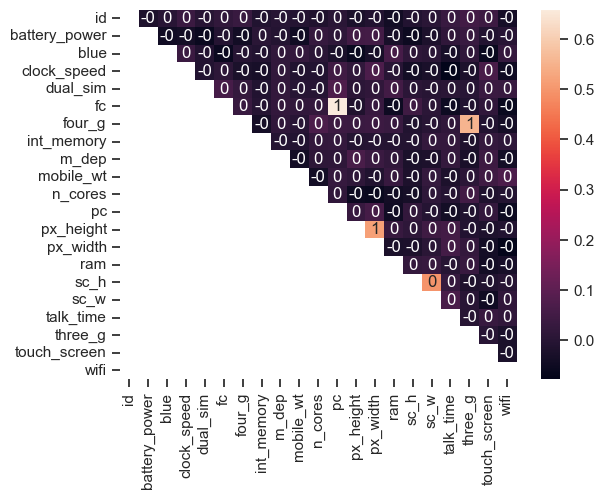

In [33]:
# Треугольный вариант матрицы
mask = np.zeros_like(data.corr(), dtype=bool)
# чтобы оставить нижнюю часть матрицы
# mask[np.triu_indices_from(mask)] = True
# чтобы оставить верхнюю часть матрицы
mask[np.tril_indices_from(mask)] = True
sns.heatmap(data.corr(), mask=mask, annot=True, fmt='.0f')

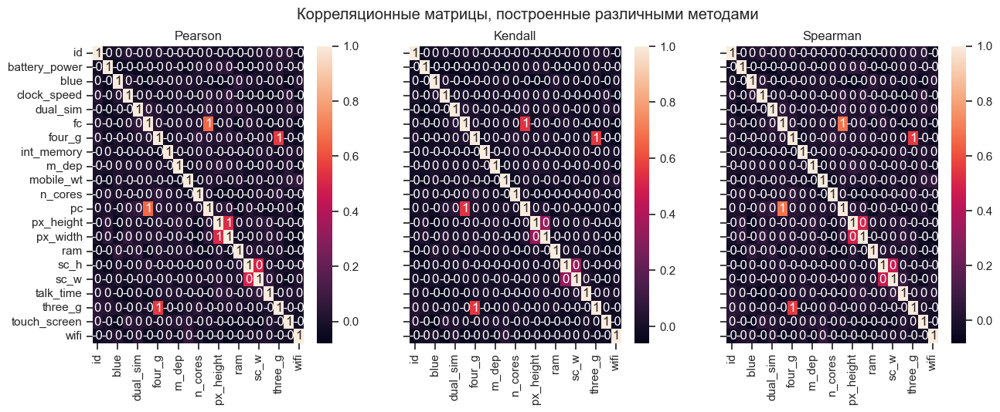

In [34]:
fig, ax = plt.subplots(1, 3, sharex='col', sharey='row', figsize=(15,5))
sns.heatmap(data.corr(method='pearson'), ax=ax[0], annot=True, fmt='.0f')
sns.heatmap(data.corr(method='kendall'), ax=ax[1], annot=True, fmt='.0f')
sns.heatmap(data.corr(method='spearman'), ax=ax[2], annot=True, fmt='.0f')
fig.suptitle('Корреляционные матрицы, построенные различными методами')
ax[0].title.set_text('Pearson')
ax[1].title.set_text('Kendall')
ax[2].title.set_text('Spearman')

<Axes: >

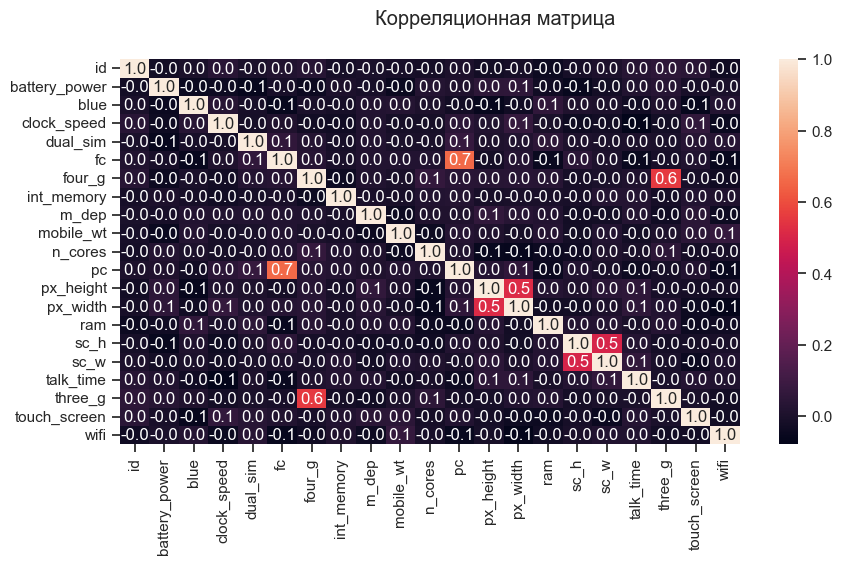

In [35]:
fig, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(10,5))
fig.suptitle('Корреляционная матрица')
sns.heatmap(data.corr(), ax=ax, annot=True, fmt='.1f')